In [1]:
#%matplotlib ipympl
%load_ext autoreload
%autoreload 2
#import mpld3
#mpld3.enable_notebook()
import grimpfunc as grimp
import nisardev as nisar
import panel as pn
pn.extension()
import rioxarray
import xarray as xr
#import holoviews as hv
import os
import matplotlib.pyplot as plt
import numpy as np
import dask
import pandas as pd
from dask.diagnostics import ProgressBar
import param
import gimpfunc.NASALogin as NASALogin
ProgressBar().register()
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
dask.config.set(num_workers=2)
import matplotlib.gridspec as gridspec

In [2]:
myLogin = NASALogin()
myLogin.view()

Getting login from ~/.netrc
Already logged in. Proceed.


In [85]:
env = dict(GDAL_HTTP_COOKIEFILE=os.path.expanduser('~/.gimp_download_cookiejar.txt'),
            GDAL_HTTP_COOKIEJAR=os.path.expanduser('~/.gimp_download_cookiejar.txt'))
os.environ.update(env)

In [86]:
myHttps = 'https://n5eil01u.ecs.nsidc.org/DP4/MEASURES/NSIDC-0723.004/2021.10.26/GL_S1bks_mosaic_26Oct21_31Oct21_image_25m_v04.0.tif'
myHttps1 = 'https://n5eil01u.ecs.nsidc.org/DP4/MEASURES/NSIDC-0723.004/2021.10.20/GL_S1bks_mosaic_20Oct21_25Oct21_image_25m_v04.0.tif'
#myHttps = myHttps.replace('image','gamma0')
vsiCurl = f'/vsicurl/?list_dir=no&url={myHttps}'


In [89]:
httpName = 'https://n5eil01u.ecs.nsidc.org/MEASURES/NSIDC-0725.003/2019.12.01/GL_vel_mosaic_Annual_01Dec19_30Nov20_*_v03.0'
products = grimp.GRiMPSubsetter(urls=[httpName],  bands=['vv', 'vx']) # vx,vy,vy, ex, ey, dT
products.loadDataArray()
products.DA

[                                        ] | 0% Completed |  0.1s


RasterioIOError: '/vsicurl/?list_dir=no&url=https://n5eil01u.ecs.nsidc.org/MEASURES/NSIDC-0725.003/2019.12.01/GL_vel_mosaic_Annual_01Dec19_30Nov20_*_v03.0' not recognized as a supported file format.

In [81]:
products = grimp.GRiMPSubsetter(urls=[myHttps.replace('*', 'sigma0').replace('.tif','')],  bands=['sigma0']) # vx,vy,vy, ex, ey, dT
products.loadStackStac()
products.DA

RasterioIOError: HTTP response code: 404

In [35]:
overView = rioxarray.open_rasterio(vsiCurl, overview_level=5,
                                    parse_coordinates=True,
                                    chunks=dict(band=1, y=512, x=512),
                                    masked=False).squeeze('band')
test  = rioxarray.open_rasterio(vsiCurl, overview_level=5,
                                    parse_coordinates=False,
                                    chunks=dict(band=1, y=512, x=512),
                                    masked=False).squeeze('band')

In [47]:
%%time
mySigma0Urls = grimp.cmrUrls(mode='image')  # mode image restricts search to the image products
mySigma0Urls.initialSearch(firstDate='2015-01-01', lastDate='2020-02-24', productFilter='gamma0');

for mySigma in mySigma0Urls.getCogs():
    vsiCurl = f'/vsicurl/?list_dir=no&url={mySigma}'
    #overView = rioxarray.open_rasterio(vsiCurl, overview_level=5,
    #                                parse_coordinates=True,
    #                                chunks=dict(band=1, y=512, x=512),
    #                                masked=False).squeeze('band')
    test  = rioxarray.open_rasterio(vsiCurl, overview_level=5,
                                   parse_coordinates=False,
                                   chunks=dict(band=1, y=512, x=512),
                                   masked=False).squeeze('band')

CPU times: user 5.09 s, sys: 1.2 s, total: 6.29 s
Wall time: 1min 1s


In [61]:
test.data.dask.get_all_dependencies()

{('open_rasterio-5d69bdcbda48d0ad59d9bd3a44c3e557<this-array>-82aabc84c49c494119542d28dd180ebe',
  0,
  1,
  0): {'open_rasterio-5d69bdcbda48d0ad59d9bd3a44c3e557<this-array>-82aabc84c49c494119542d28dd180ebe'},
 'open_rasterio-5d69bdcbda48d0ad59d9bd3a44c3e557<this-array>-82aabc84c49c494119542d28dd180ebe': set(),
 ('open_rasterio-5d69bdcbda48d0ad59d9bd3a44c3e557<this-array>-82aabc84c49c494119542d28dd180ebe',
  0,
  0,
  0): {'open_rasterio-5d69bdcbda48d0ad59d9bd3a44c3e557<this-array>-82aabc84c49c494119542d28dd180ebe'},
 ('getitem-387998856d47ad76244b231dcc02047a',
  0,
  0): {('open_rasterio-5d69bdcbda48d0ad59d9bd3a44c3e557<this-array>-82aabc84c49c494119542d28dd180ebe',
   0,
   0,
   0)},
 ('getitem-387998856d47ad76244b231dcc02047a',
  1,
  0): {('open_rasterio-5d69bdcbda48d0ad59d9bd3a44c3e557<this-array>-82aabc84c49c494119542d28dd180ebe',
   0,
   1,
   0)}}

In [73]:
test.data.dask['open_rasterio-5d69bdcbda48d0ad59d9bd3a44c3e557<this-array>-82aabc84c49c494119542d28dd180ebe'].array.__getitem__

<bound method CopyOnWriteArray.__getitem__ of CopyOnWriteArray(array=LazilyIndexedArray(array=<rioxarray._io.RasterioArrayWrapper object at 0x286799100>, key=BasicIndexer((slice(None, None, None), slice(None, None, None), slice(None, None, None)))))>

In [34]:
myCopy = xr.full_like(overView, 1)
myData = dask.array.from_array(myHttps, chunks=dict(band=1, y=512, x=512), overview_level=5)
#myCopy.data = 

TypeError: from_array() got an unexpected keyword argument 'overview_level'

[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s


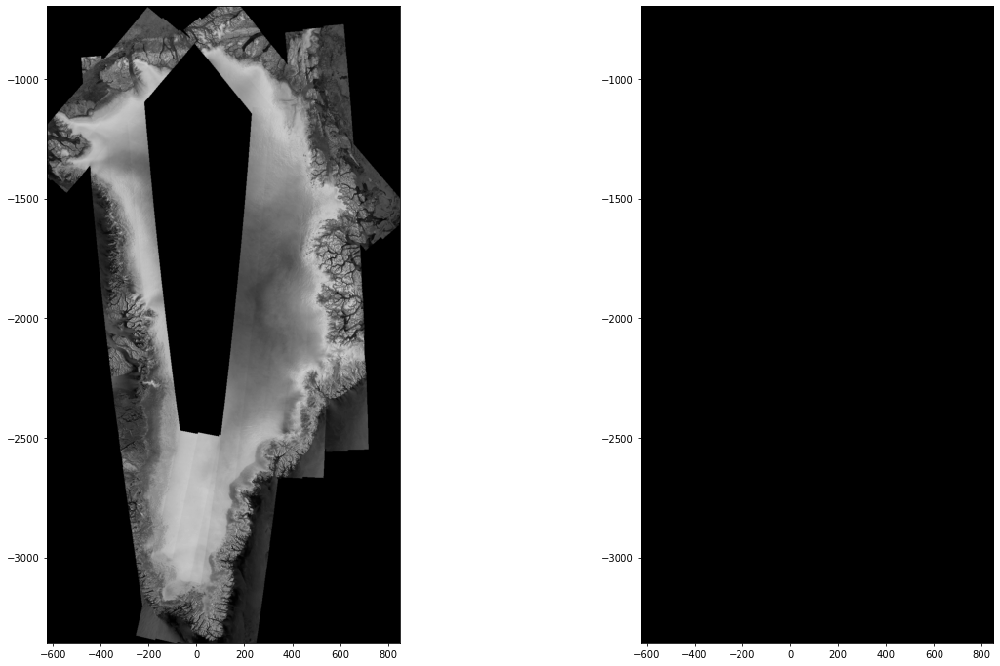

In [29]:
fig, axes = plt.subplots(1, 2,figsize=(20,12))

axes[0].imshow(overView, cmap='gray', extent=extent)
axes[1].imshow(myCopy, cmap='gray', extent=extent)

[########################################] | 100% Completed |  0.1s


In [22]:
bbox = {'minx': -243500, 'miny': -2295000, 'maxx': -149000, 'maxy': -2255000}
xbox = np.array([bbox[x] for x in ['minx', 'minx', 'maxx', 'maxx', 'minx']]) * 0.001
ybox = np.array([bbox[y] for y in ['miny', 'maxy', 'maxy', 'miny', 'miny']]) * 0.001

[########################################] | 100% Completed |  0.1s


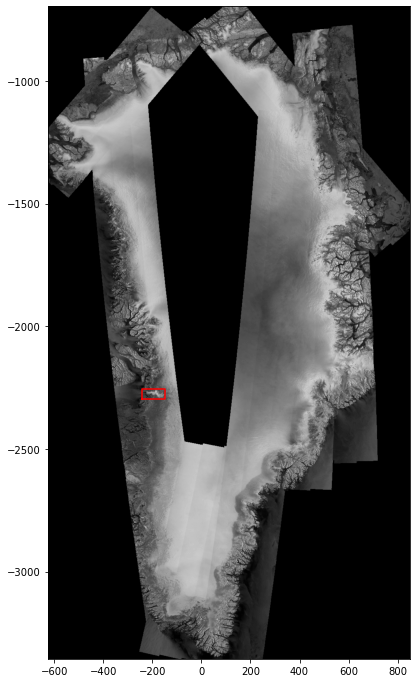

In [23]:
extent = np.array([np.min(overView.x.data), np.max(overView.x.data),
         np.min(overView.y.data), np.max(overView.y.data)]) * 0.001
fig, ax = plt.subplots(1,1,figsize=(20,12))
ax.imshow(overView, cmap='gray', extent=extent)
ax.plot(xbox, ybox, 'r')

In [9]:
fullImage = rioxarray.open_rasterio(vsiCurl,
                              chunks=dict(band=1, y=512, x=512),
                              masked=False).squeeze('band')
croppedImage = fullImage.rio.clip_box(**bbox)

[########################################] | 100% Completed |  7.1s


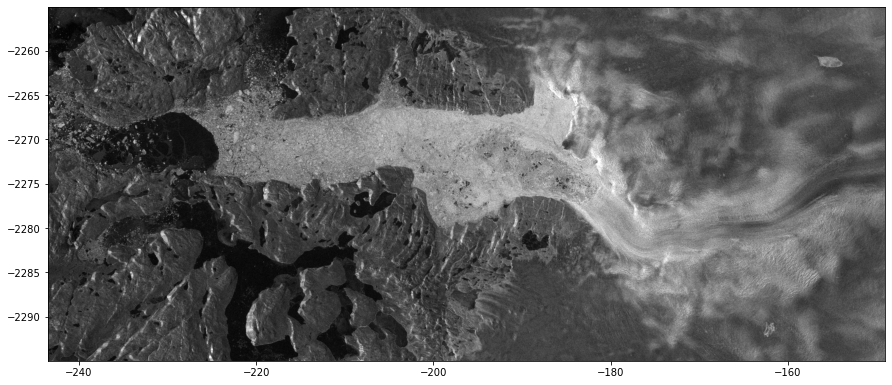

In [10]:
extent = np.array([np.min(croppedImage.x.data), np.max(croppedImage.x.data),
         np.min(croppedImage.y.data), np.max(croppedImage.y.data)]) * 0.001
fig, ax = plt.subplots(1,1,figsize=(15,8))
ax.imshow(croppedImage, cmap='gray', extent=extent)


In [11]:
croppedImage

<xarray.DataArray (y: 1600, x: 3780)>
dask.array<getitem, shape=(1600, 3780), dtype=uint8, chunksize=(512, 512), chunktype=numpy.ndarray>
Coordinates:
    band         int64 1
  * x            (x) float64 -2.435e+05 -2.435e+05 ... -1.49e+05 -1.49e+05
  * y            (y) float64 -2.255e+06 -2.255e+06 ... -2.295e+06 -2.295e+06
    spatial_ref  int64 0
Attributes:
    STATISTICS_MAXIMUM:        255
    STATISTICS_MEAN:           107.92455959703
    STATISTICS_MINIMUM:        1
    STATISTICS_STDDEV:         51.920925946723
    STATISTICS_VALID_PERCENT:  50.78
    scale_factor:              1.0
    add_offset:                0.0
    _FillValue:                0

In [12]:
from datetime import datetime
print(myHttps)
os.path.basename(myHttps).split('_')[4]
datetime.strptime(os.path.basename(myHttps).split('_')[4], '%d%b%y')

https://n5eil01u.ecs.nsidc.org/DP4/MEASURES/NSIDC-0723.004/2021.10.26/GL_S1bks_mosaic_26Oct21_31Oct21_image_25m_v04.0.tif


datetime.datetime(2021, 10, 31, 0, 0)

[########################################] | 100% Completed |  0.1s


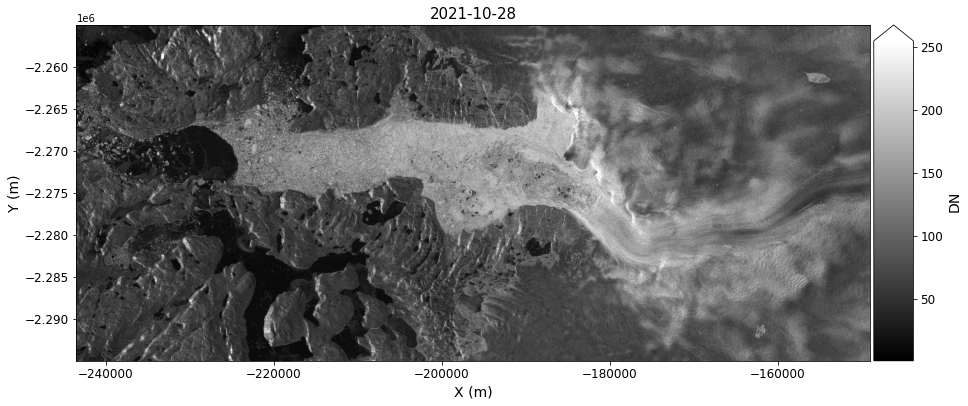

In [13]:
fig, ax = plt.subplots(1, 1, figsize=(15, 8))
myImage = nisar.nisarImage()
myImage.readDataFromTiff(myHttps)
myImage.subSetImage(bbox)
myImage.loadRemote()
myImage.displayImage(ax=ax)
#myImage.displayImage(ax=ax)

[########################################] | 100% Completed |  1.1s


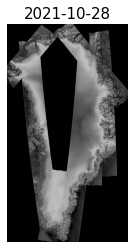

In [14]:
fig, ax = plt.subplots(1,1)
myOverview = nisar.nisarImage()
myOverview.readDataFromTiff(myHttps, overviewLevel=4)
myOverview.loadRemote()
myOverview.displayImage(ax=ax, colorBar=False, axisOff=True)

[########################################] | 100% Completed |  4.7s


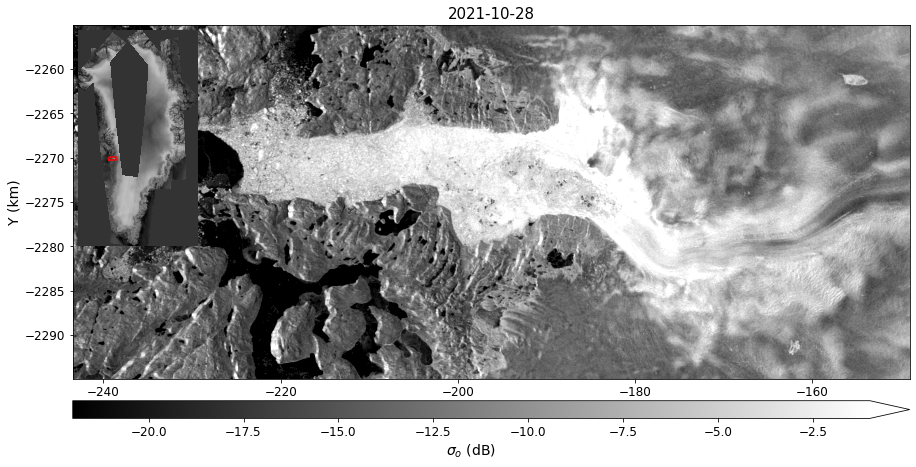

In [15]:
from matplotlib import colors
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig, ax = plt.subplots(1, 1, figsize=(15, 8))
height = 3
axInset = inset_axes(ax, width=height * myOverview.sx/myOverview.sy, height=height, loc=2)

myHttpsSigma0 = myHttps.replace('image','sigma0').replace('25m', '50m')
myImage = nisar.nisarImage()

myImage.readDataFromTiff(myHttpsSigma0)
myImage.subSetImage(bbox)
myImage.loadRemote()
myImage.displayImage(ax=ax, percentile=95, units='km', colorBarPosition='bottom', colorBarPad=.3)
myOverview.displayImage(ax=axInset, colorBar=False, axisOff=True, units='km', masked=0, cmap=plt.cm.gray.with_extremes(bad=(.2,0.2,.2)), title='')
axInset.plot(xbox, ybox, 'r')

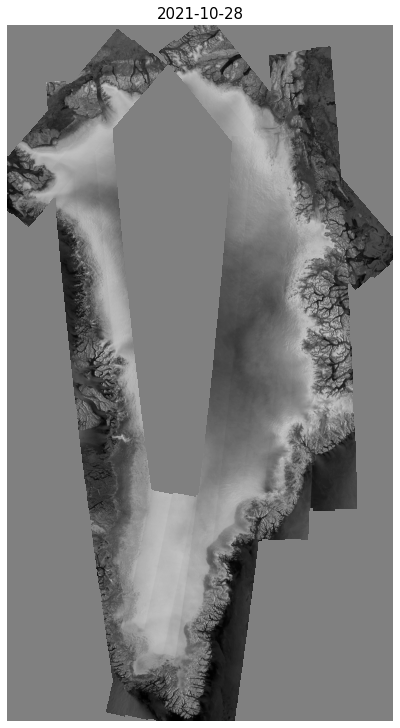

In [16]:

myOverview.displayImage(colorBar=False, axisOff=True, units='km', masked=0, cmap=plt.cm.gray.with_extremes( bad='gray'))

In [17]:
myHttpsSeries = [myHttps, myHttps1]
myImageSeries = nisar.nisarImageSeries()
myImageSeries.readSeriesFromTiff(myHttpsSeries)
myImageSeries.subSetImage(bbox)
myImageSeries.loadRemote()

[########################################] | 100% Completed | 11.7s


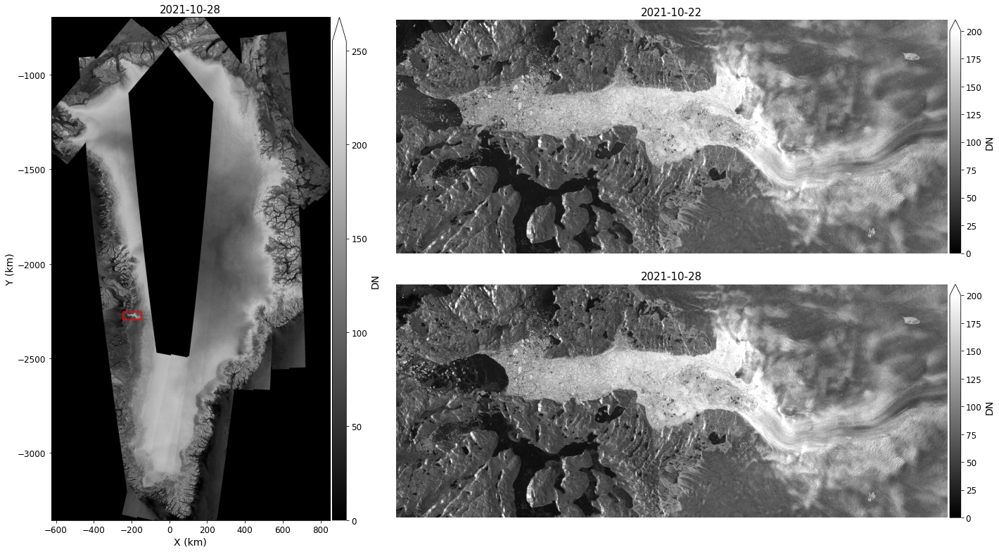

In [18]:
fig = plt.figure(figsize=(20,11))
gs = gridspec.GridSpec(2, 10)
axOverview = plt.subplot(gs[:, 0:4])
axes = [plt.subplot(gs[0, 4:]), plt.subplot(gs[1, 4:])]
myOverview.displayImage(ax=axOverview, units='km')
axOverview.plot(xbox, ybox, 'r')
#
for ax, date in zip(axes, myImageSeries.time):
    myImageSeries.displayImageForDate(date=date, ax=ax, percentile=95, units='km', cmap='gray', colorBarSize='2%')
    ax.axis('off')
fig.tight_layout() 